In [1]:
import matplotlib.pyplot as plt
import numpy as np
from typing import Literal
import matplotlib.pyplot as plt
import PIL.Image as Image
from glob import glob
import os
%matplotlib inline


In [2]:
img_arr = []
img_arr = os.listdir('/media/umic/my_label/stranger_sections_2/stranger-sections-2-starter-notebook/training_images/image')

Labels: \
Vitrinite: 1 \
Inertite: 2 \
Liptinite: 3 

/tmp/ipykernel_21478/3258586545.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 3, figsize=(20, 10))


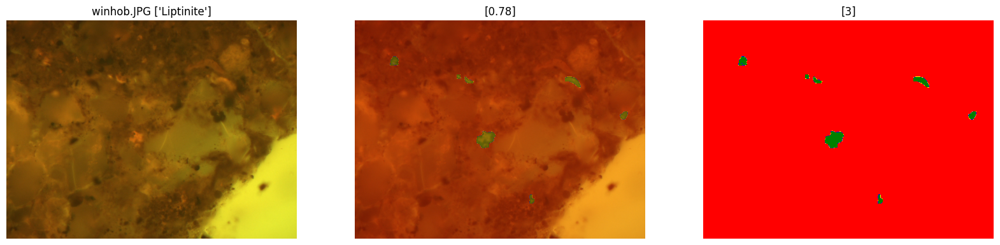

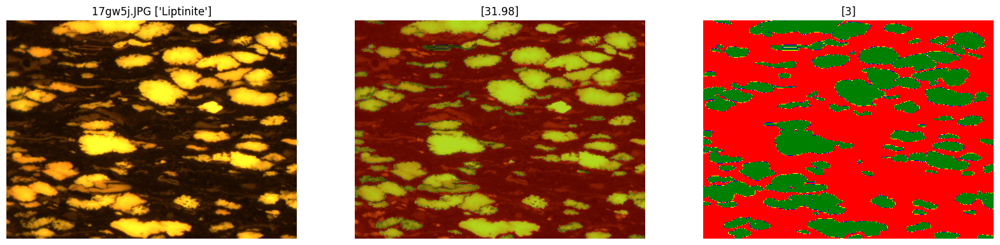

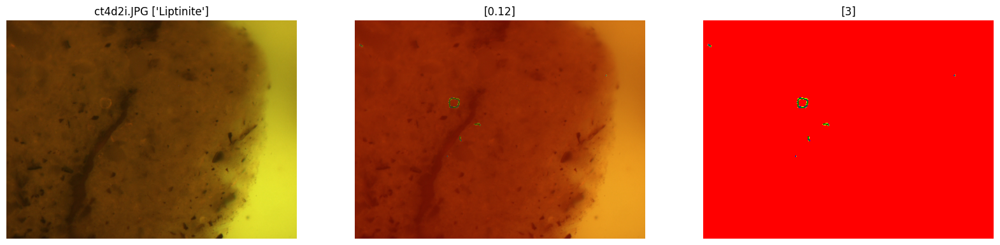

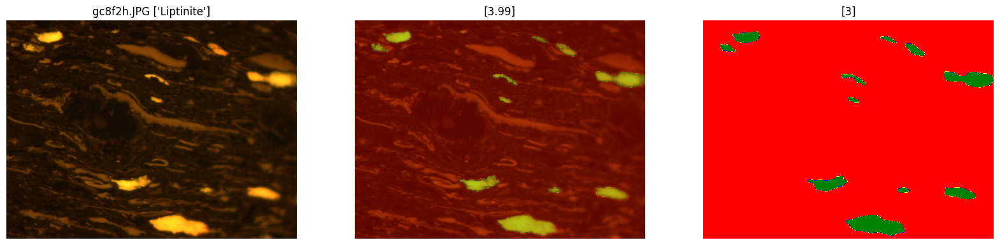

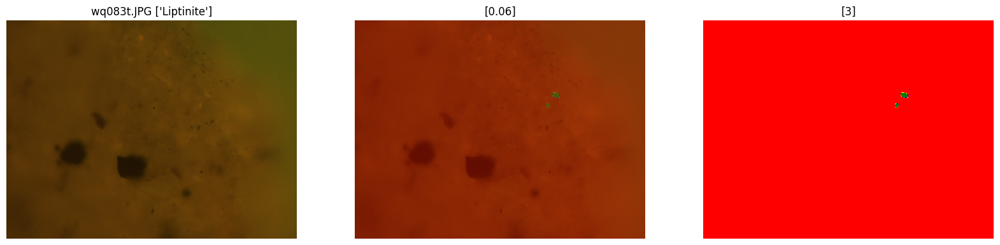

...

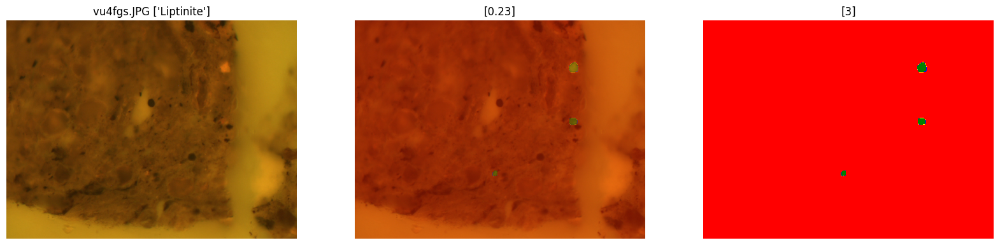

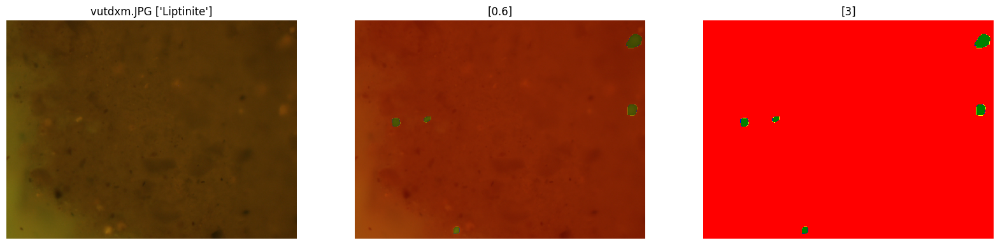

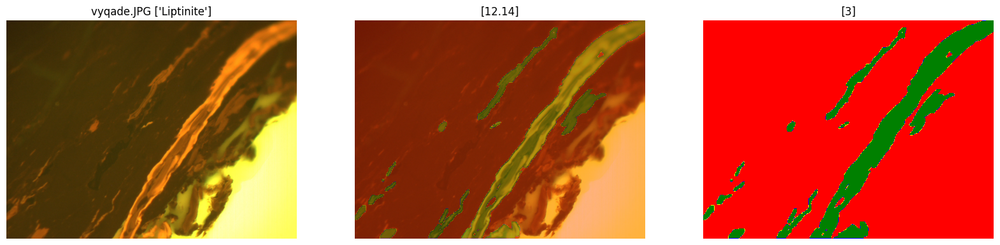

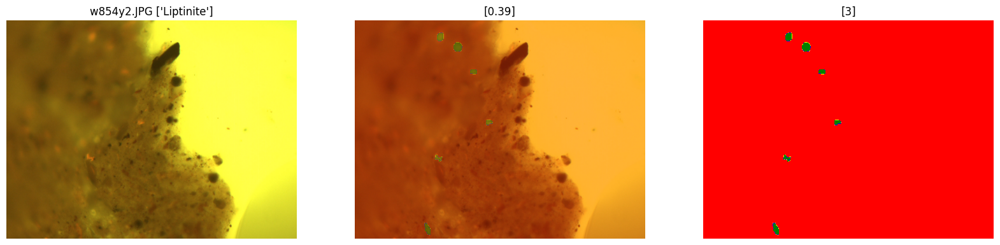

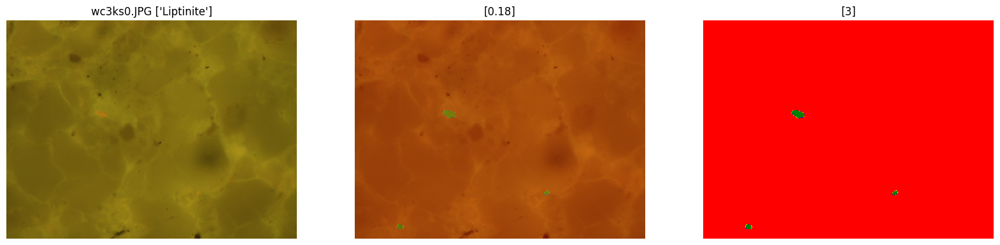

In [26]:
from matplotlib.colors import ListedColormap
colors = ['red', 'yellow', 'blue', 'green']

cmap = ListedColormap(colors)

mineral_names = {
    0: '',
    1: 'Vitrinite',
    2: 'Inertite',
    3: 'Liptinite' 
}

for i, img in enumerate(img_arr):
    imgg = np.asarray(Image.open('/media/umic/my_label/stranger_sections_2/stranger-sections-2-starter-notebook/training_images/image/' + img))
    masks = np.load('/media/umic/my_label/stranger_sections_2/stranger-sections-2-starter-notebook/label/' + str(img.replace('.JPG','_gt.npy')))

    unique, counts = np.unique(masks, return_counts=True)
    ratios = np.floor(counts / sum(counts) * 1e4) / 100

    if 1 not in unique:
        continue

    names = [mineral_names[n] for n in unique]

    fig, ax = plt.subplots(1, 3, figsize=(20, 10))
  
    ax[0].imshow(imgg)
    ax[0].set_title(f'{img} {names[1:]}')
    ax[0].axis('off')
  
    ax[1].imshow(imgg)
    ax[1].set_title(f'{list(ratios[1:])}')
    ax[1].axis('off')
    ax[1].imshow(masks, alpha=0.3,cmap=cmap)

    ax[2].imshow(masks,cmap=cmap)
    ax[2].set_title(f'{list(unique[1:])}')
    ax[2].axis('off')

    # break

plt.show()